<a href="https://colab.research.google.com/github/thomasp3450/CV-project-IAT360/blob/main/CV-Project-IAT360.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [16]:
import ultralytics
ultralytics.checks()

Ultralytics 8.3.220  Python-3.13.7 torch-2.9.0+cpu CPU (AMD Ryzen 7 5800X 8-Core Processor)
Setup complete  (16 CPUs, 31.9 GB RAM, 868.1/931.4 GB disk)


In [55]:
import yaml
import os

def create_data_yaml(classes_path, data_yaml_path): #create yaml file
    with open(classes_path, 'r') as f:
        classes = []
        for line in f.readlines():
            if len(line.strip()) == 0: continue
            classes.append(line.strip())
    number_of_classes = len(classes)


    data = {
        'path' : 'Documents/GitHub/CV-project-IAT360/ourdata',
        'train' : 'images/train',
        'val' : 'images/val',
        'nc' : number_of_classes,
        'names' : classes
    }

    with open(data_yaml_path, 'w') as f: #print out the path for the yaml file
        yaml.dump(data, f, sort_keys=False)
        print(f'Data YAML file created at {data_yaml_path}')
    return

# Define path to classes.txt and run function
path_to_classes_txt = 'Documents/GitHub/CV-project-IAT360/ourdata/classes.txt'
path_to_data_yaml = 'Documents/GitHub/CV-project-IAT360/ourdata/data.yaml'

create_data_yaml(path_to_classes_txt, path_to_data_yaml)



Data YAML file created at Documents/GitHub/CV-project-IAT360/ourdata/data.yaml


In [56]:
!yolo detect train data=data.yaml model=yolov8n.pt epochs=60 imgsz=640

Ultralytics 8.3.220  Python-3.13.7 torch-2.9.0+cpu CPU (AMD Ryzen 7 5800X 8-Core Processor)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=60, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train28, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pret

In [61]:
!yolo detect predict model=runs/detect/train28/weights/best.pt source=Documents/GitHub/CV-project-IAT360/ourdata/images/val save=True

Ultralytics 8.3.220  Python-3.13.7 torch-2.9.0+cpu CPU (AMD Ryzen 7 5800X 8-Core Processor)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs

image 1/30 C:\Users\Thomas\Documents\GitHub\CV-project-IAT360\ourdata\images\val\1.jpg: 448x640 (no detections), 37.7ms
image 2/30 C:\Users\Thomas\Documents\GitHub\CV-project-IAT360\ourdata\images\val\10.jpg: 480x640 (no detections), 38.1ms
image 3/30 C:\Users\Thomas\Documents\GitHub\CV-project-IAT360\ourdata\images\val\11.jpg: 384x640 (no detections), 33.3ms
image 4/30 C:\Users\Thomas\Documents\GitHub\CV-project-IAT360\ourdata\images\val\12.jpg: 448x640 (no detections), 28.3ms
image 5/30 C:\Users\Thomas\Documents\GitHub\CV-project-IAT360\ourdata\images\val\13.jpg: 480x640 (no detections), 29.3ms
image 6/30 C:\Users\Thomas\Documents\GitHub\CV-project-IAT360\ourdata\images\val\14.jpg: 384x640 (no detections), 26.1ms
image 7/30 C:\Users\Thomas\Documents\GitHub\CV-project-IAT360\ourdata\images\val\15.jpg: 448x640 (no d

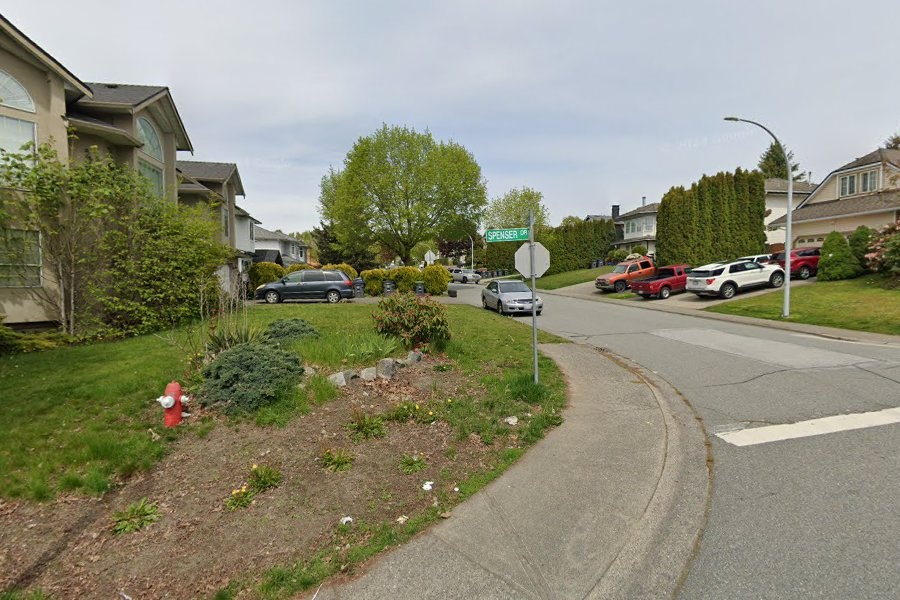

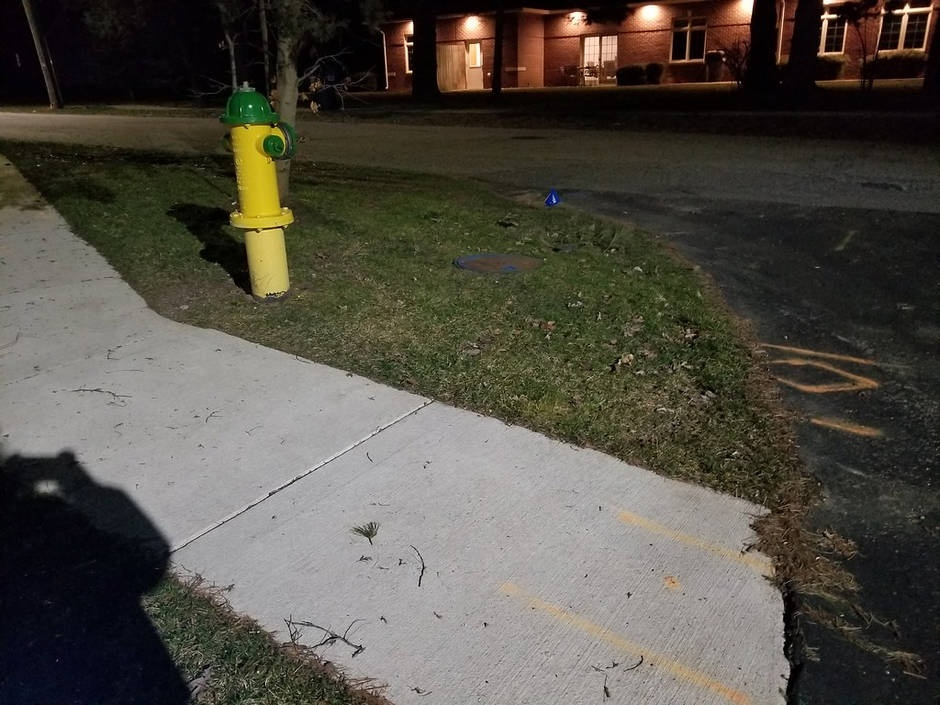

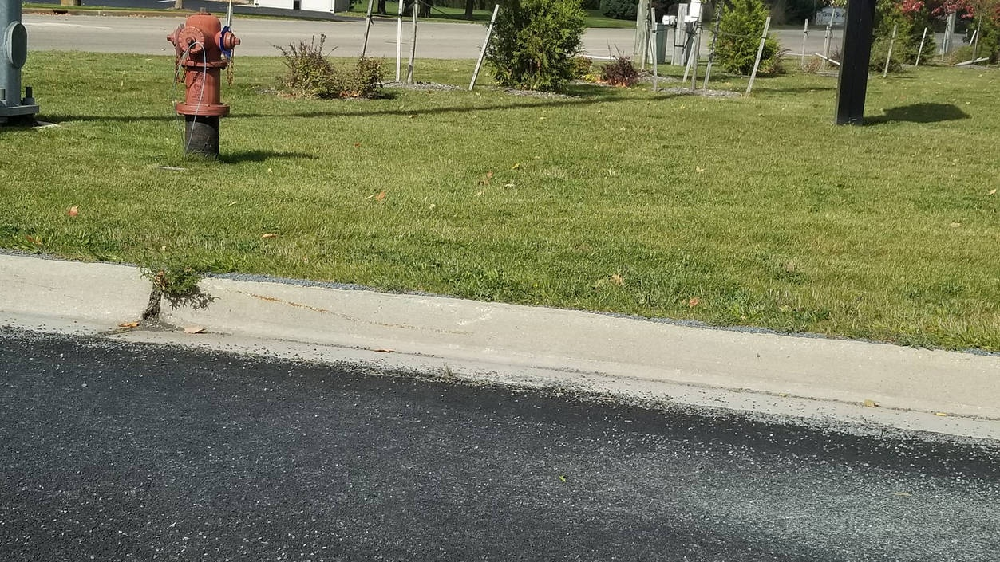

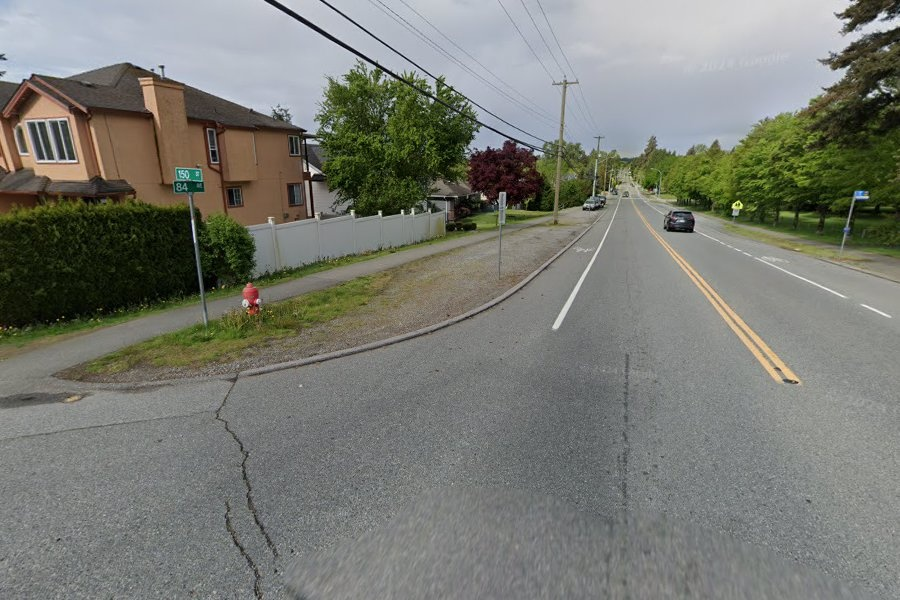

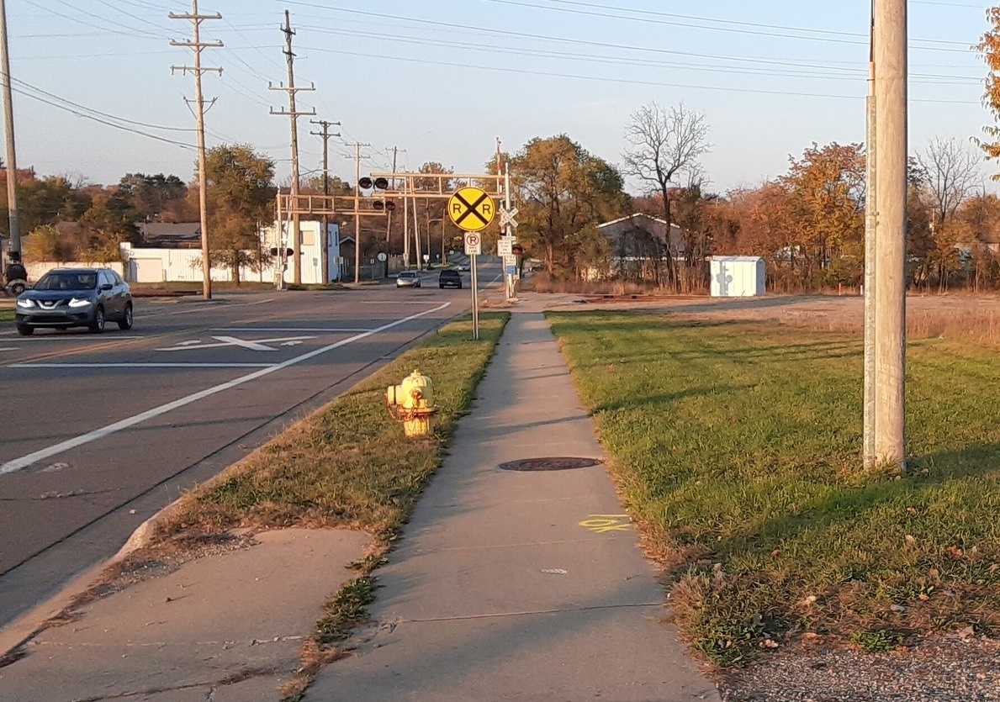

...

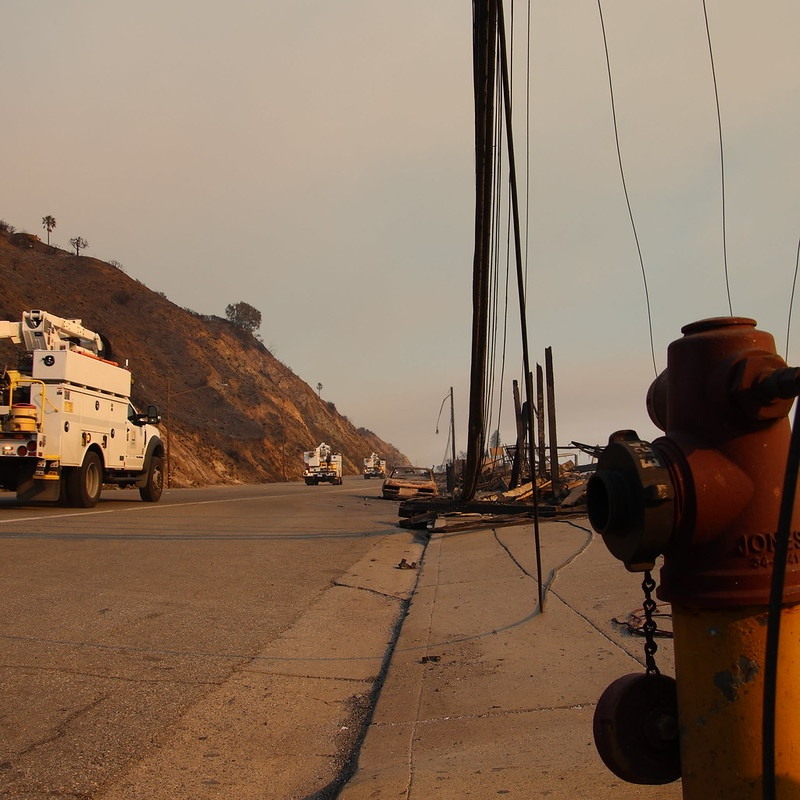

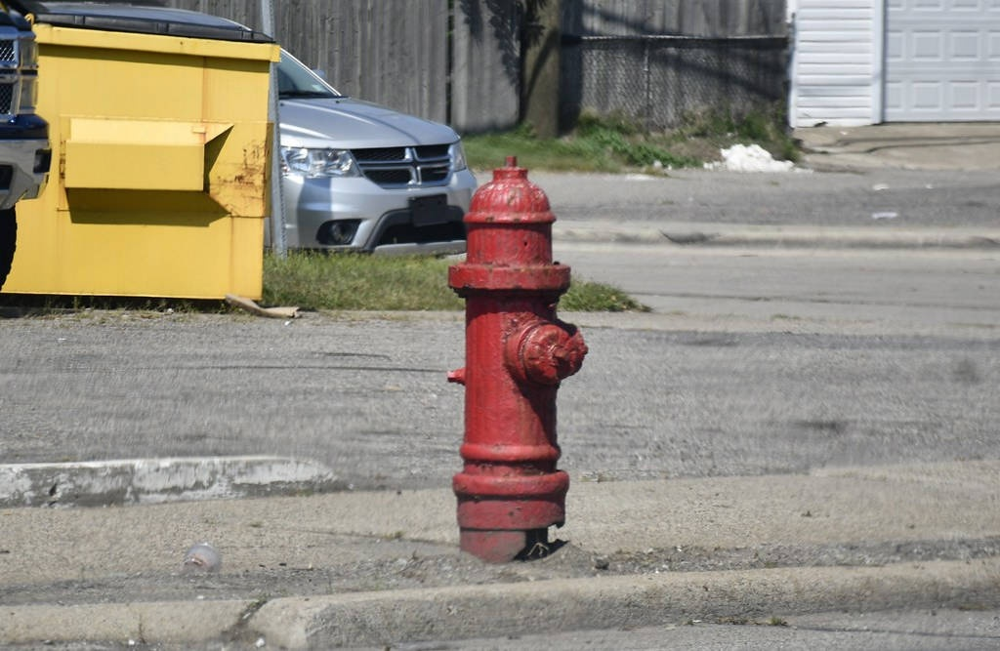

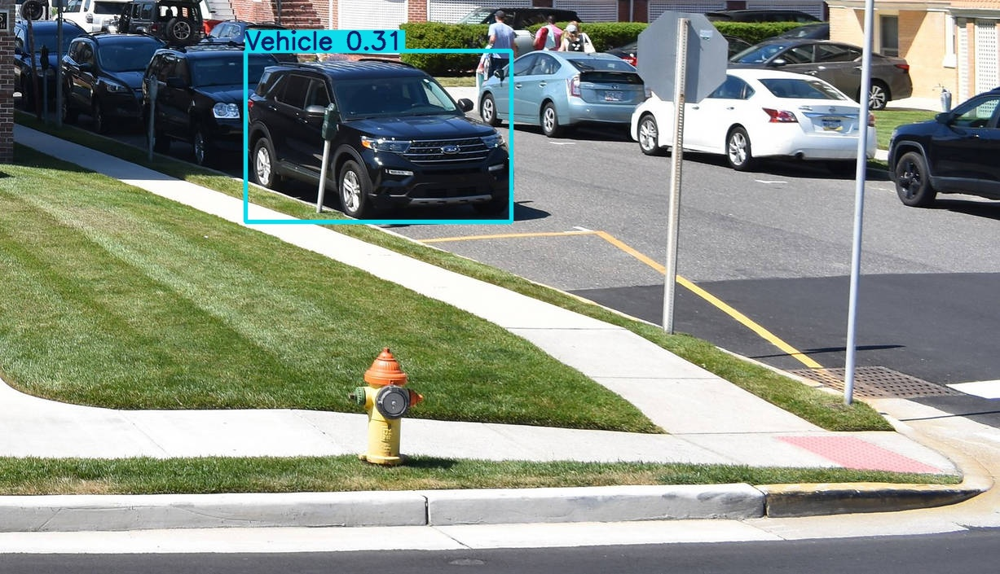

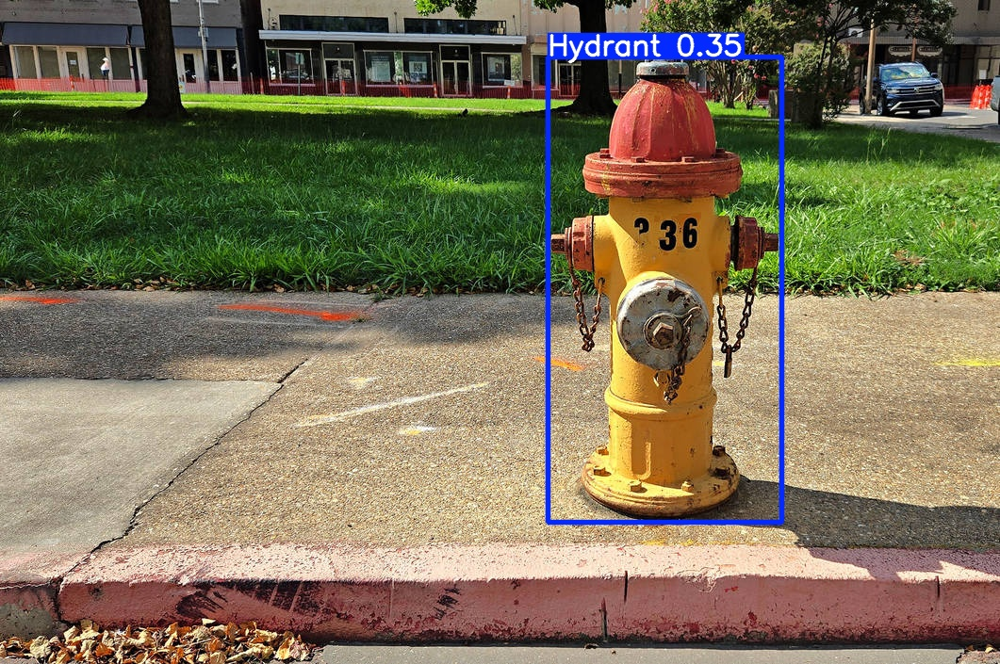

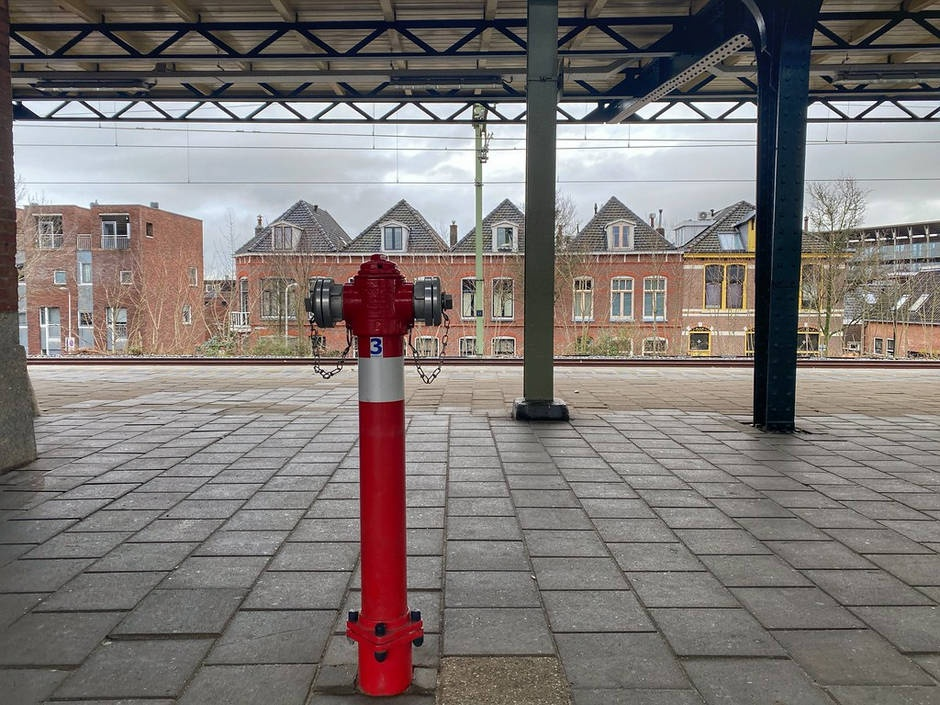

In [66]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('runs/detect/predict/*.jpg'):
    display(Image(filename=imageName))
    print("\n")

In [67]:
# Create "my_model" folder to store model weights and train results
!mkdir /content/my_model
!cp /content/runs/detect/train/weights/best.pt /content/my_model/my_model.pt
!cp -r /content/runs/detect/train /content/my_model

# Zip into "my_model.zip"
%cd my_model
!zip /content/my_model.zip my_model.pt
!zip -r /content/my_model.zip train
%cd /content

The syntax of the command is incorrect.
'cp' is not recognized as an internal or external command,
operable program or batch file.


[WinError 2] The system cannot find the file specified: 'my_model'
C:\Users\Thomas


'cp' is not recognized as an internal or external command,
operable program or batch file.
'zip' is not recognized as an internal or external command,
operable program or batch file.


[WinError 2] The system cannot find the file specified: '/content'
C:\Users\Thomas


'zip' is not recognized as an internal or external command,
operable program or batch file.
